# Exploratory Analysis of Gesture Images
## Importing Dependencies

In [33]:
import os
import string
import random

import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt
 
import torch
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
from torchvision.utils import make_grid

try:
    import mediapipe as mp 
except Exception as e:
    print(f"Error import `mediapipe`: {e}")

In [22]:
data_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "data"))

In [24]:
reports_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "reports", "data_visualization"))

In [4]:
synthetic_train_data_dir = os.path.join(data_dir, "Train_Alphabet")
synthetic_test_data_dir = os.path.join(data_dir, "Test_Alphabet")

In [5]:
# List of all the letters in the ASL alphabet and other gestures
classes = list(string.ascii_uppercase)
classes.remove("Z")  # Remove 'Z' as it requires movement.
# Keep 'J' despite its movement, since a static 'J' gesture 
# remains valid and is not easily confused with other gestures.
classes.append("nothing")  # Add a class for 'nothing' (background without a gesture)

# Number of classes
num_classes = len(classes)

class_to_idx = {classes[i]: i for i in range(num_classes)}
print(class_to_idx)

{'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'J': 9, 'K': 10, 'L': 11, 'M': 12, 'N': 13, 'O': 14, 'P': 15, 'Q': 16, 'R': 17, 'S': 18, 'T': 19, 'U': 20, 'V': 21, 'W': 22, 'X': 23, 'Y': 24, 'nothing': 25}


## Utility Functions

In [6]:
def get_dir_filenames(data_dir, class_name=None) -> list:
    """
    Get the filenames of all images in the given directory.
    """
    filenames = []
    
    for root, _, files in os.walk(data_dir):
        basename = os.path.basename(root)
        if class_name is not None and basename == class_name:
            for file in files:
                if file.endswith(('.png', '.jpg', '.jpeg')):
                    filenames.append(os.path.join(root, file))
                
    return filenames

In [7]:
def read_image(image_path, size=(224, 224)):
    """
    Read an image from the given path and convert it to a numpy array.
    """
    image = Image.open(image_path).convert("RGB")
    image = image.resize(size) 
    
    return np.array(image) 

In [8]:
def show_image(image, title=None):
    """
    Display an image with an optional title.
    """
    plt.imshow(image)
    
    if title:
        plt.title(title)
        
    plt.axis('off')
    plt.show()

In [18]:
def show_image_grid(images, ncols=4, title=None):
    """
    Display a grid of images with an optional title.
    """
    grid = make_grid(images, nrow=ncols)
    plt.imshow(grid.permute(1, 2, 0))
    
    if title:
        plt.title(title)
        
    plt.axis('off')
    fig = plt.gcf()
    plt.show()
    
    return fig

In [10]:
def get_random_images(image_paths, n=4):
    """
    Get a random sample of images from the given list of image paths.
    """
    random_images = random.sample(image_paths, n)
    return [img_path for img_path in random_images]

In [25]:
def save_figure(fig, filename):
    """
    Save the given figure to a file.
    """
    fig.savefig(filename)
    print(f"Figure saved ✅")

In [29]:
def get_hand_landmarks(image_path):
    """
    Get hand landmarks from the given image using MediaPipe.
    """
    mp_hands = mp.solutions.hands
    mp_drawing = mp.solutions.drawing_utils
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)
    
    image = read_image(image_path)
    
    results = hands.process(image)
    
    if results.multi_hand_landmarks:
        hand_landmarks = results.multi_hand_landmarks[0]
        mp_drawing.draw_landmarks(
            image,
            hand_landmarks,
            mp_hands.HAND_CONNECTIONS,  
            mp_drawing.DrawingSpec(color=(0,255,0), thickness=2, circle_radius=3), 
            mp_drawing.DrawingSpec(color=(0,0,255), thickness=2)  
        )
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        return hand_landmarks
    else:
        return None

In [32]:
def get_bbox_from_hand_landmarks(landmarks, img_width, img_height):
    """
    From given 21 normalized (in range [0, 1]) hand `landmarks`, return bounding
    box for the corresponding hand on image.
    """
    xs = [landmark.x for landmark in landmarks.landmark]
    ys = [landmark.y for landmark in landmarks.landmark]

    x_min = min(xs)
    x_max = max(xs)
    y_min = min(ys)
    y_max = max(ys)

    padding = 0.25  # 25% of image size relative range
    x_range = x_max - x_min
    y_range = y_max - y_min

    x_min = x_min - padding * x_range
    x_max = x_max + padding * x_range
    y_min = y_min - padding * y_range
    y_max = y_max + padding * y_range

    x_min_px = int(x_min * img_width)
    x_max_px = int(x_max * img_width)
    y_min_px = int(y_min * img_height)
    y_max_px = int(y_max * img_height)

    return [x_min_px, y_min_px, x_max_px, y_max_px]

In [ ]:
rgb_mean, rgb_std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]

def apply_transforms(image, size=(224, 224), transforms=None):
    """
    Apply transformations to the image.
    """
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize(mean=rgb_mean, std=rgb_std),
    ])
    
    return transform(image)

## Dataset Overview: Visualizing Sample Images


In [11]:
synthetic_train_filenames_dict = {}

for class_name in classes:
    filenames = get_dir_filenames(synthetic_train_data_dir, class_name)
    synthetic_train_filenames_dict[class_name] = filenames
    print(f"Class: {class_name}, Number of images: {len(filenames)}")

Class: A, Number of images: 900
Class: B, Number of images: 900
Class: C, Number of images: 900
Class: D, Number of images: 900
Class: E, Number of images: 900
Class: F, Number of images: 900
Class: G, Number of images: 900
Class: H, Number of images: 900
Class: I, Number of images: 900
Class: J, Number of images: 900
Class: K, Number of images: 900
Class: L, Number of images: 900
Class: M, Number of images: 900
Class: N, Number of images: 900
Class: O, Number of images: 900
Class: P, Number of images: 900
Class: Q, Number of images: 900
Class: R, Number of images: 900
Class: S, Number of images: 900
Class: T, Number of images: 900
Class: U, Number of images: 900
Class: V, Number of images: 900
Class: W, Number of images: 900
Class: X, Number of images: 900
Class: Y, Number of images: 900
Class: nothing, Number of images: 900


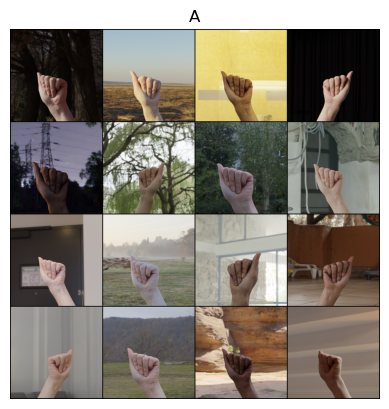

Figure saved ✅


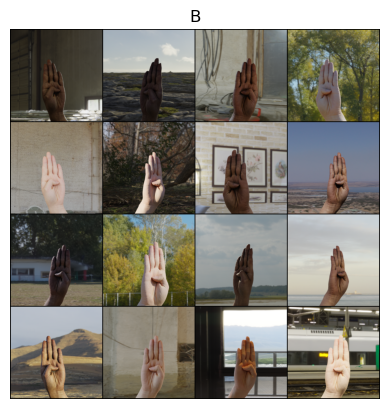

Figure saved ✅


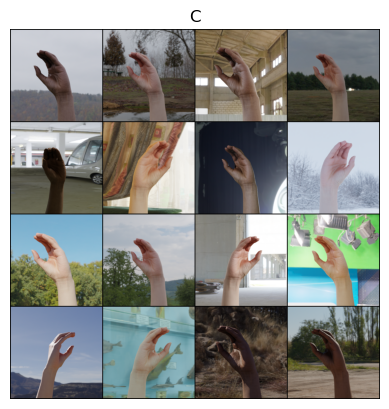

Figure saved ✅


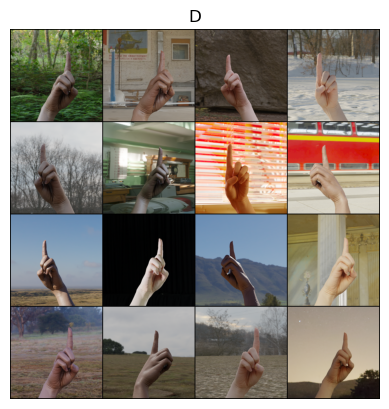

Figure saved ✅


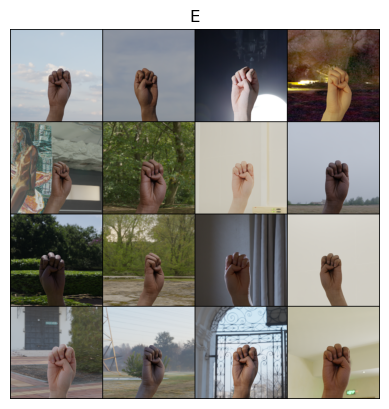

Figure saved ✅


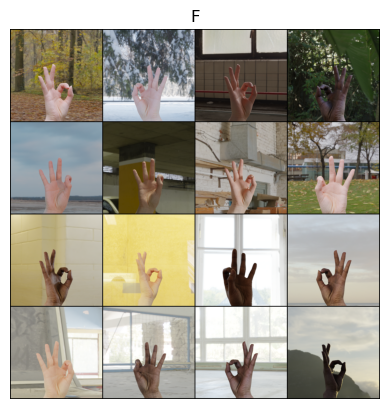

Figure saved ✅


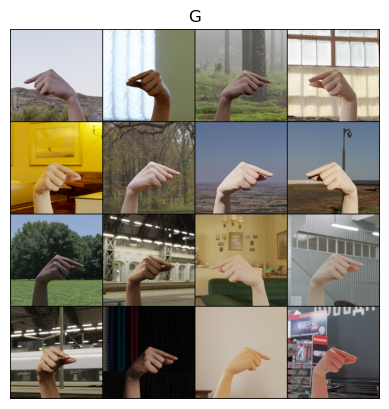

Figure saved ✅


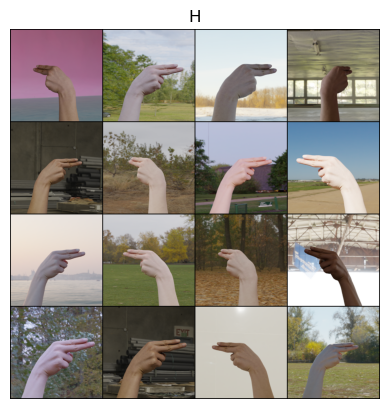

Figure saved ✅


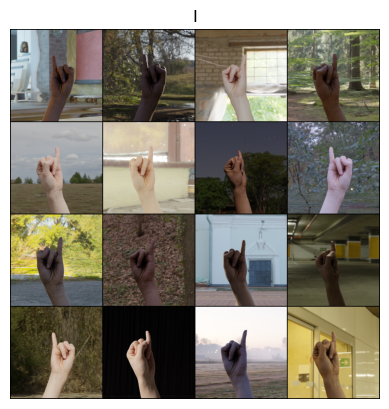

Figure saved ✅


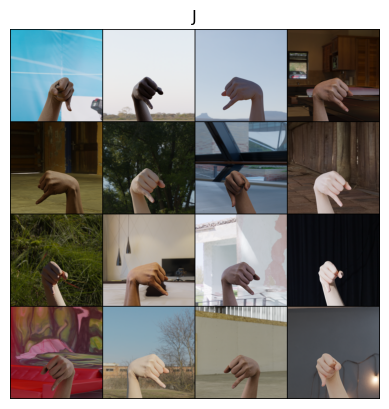

Figure saved ✅


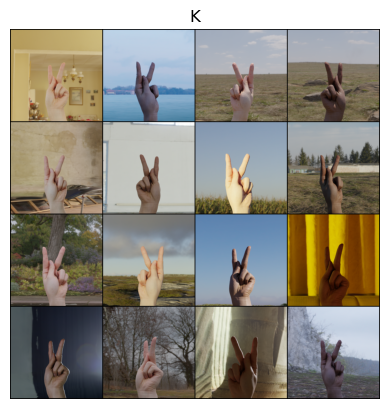

Figure saved ✅


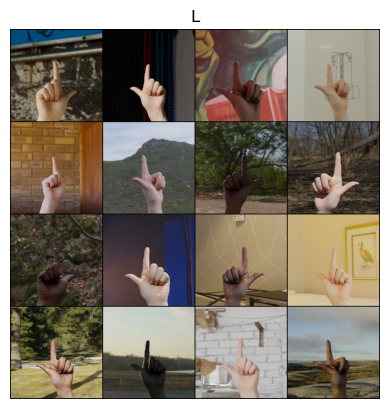

Figure saved ✅


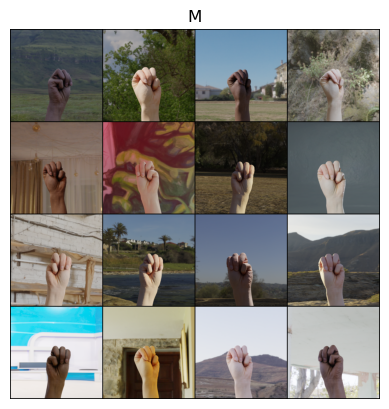

Figure saved ✅


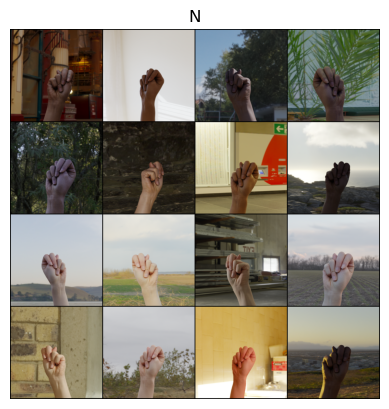

Figure saved ✅


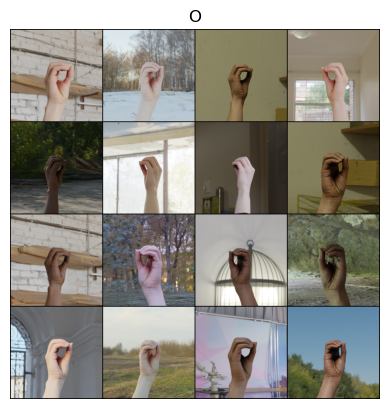

Figure saved ✅


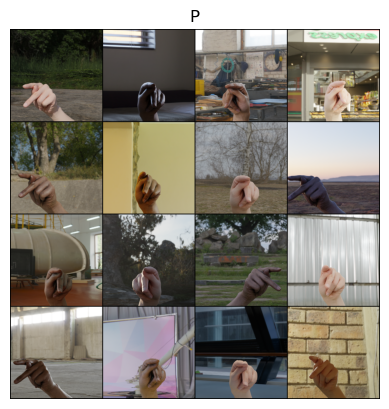

Figure saved ✅


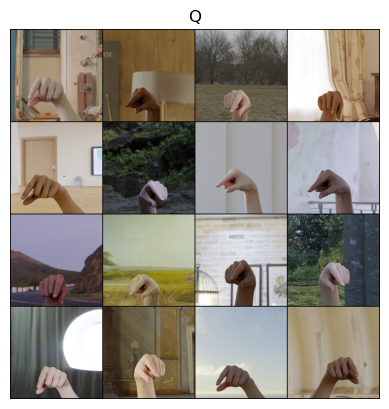

Figure saved ✅


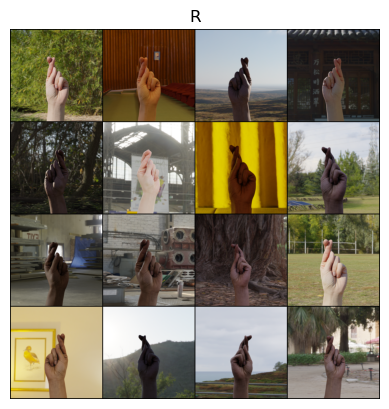

Figure saved ✅


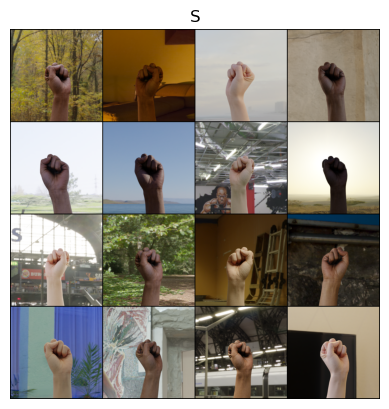

Figure saved ✅


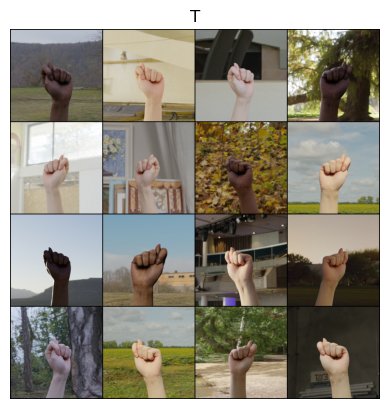

Figure saved ✅


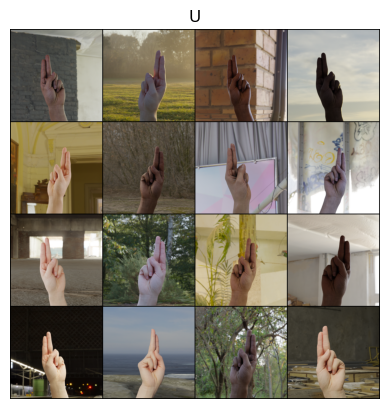

Figure saved ✅


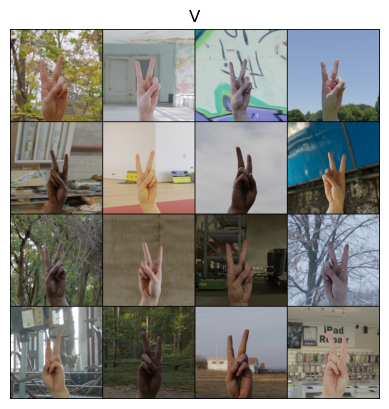

Figure saved ✅


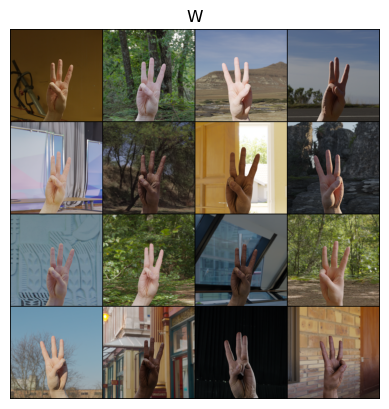

Figure saved ✅


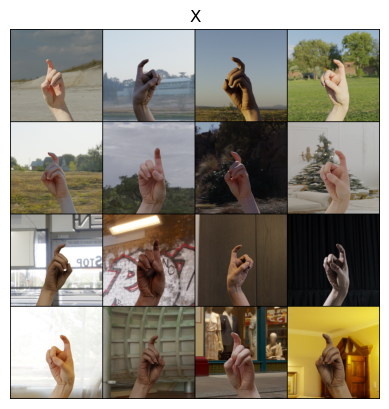

Figure saved ✅


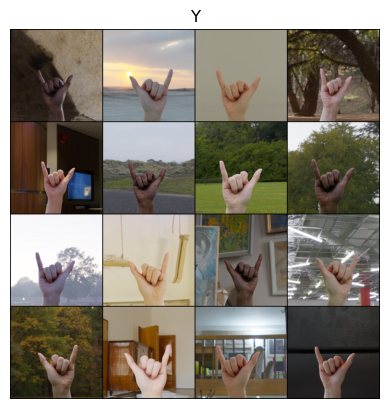

Figure saved ✅


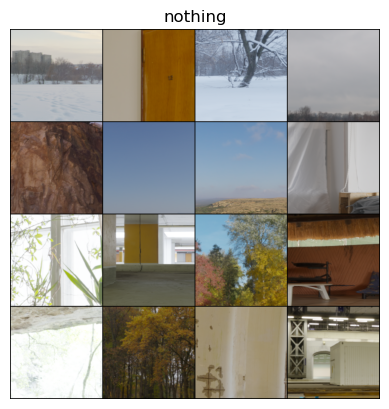

Figure saved ✅


In [34]:
n_images = 16
target_size = (224, 224)

for key, value in synthetic_train_filenames_dict.items():
    images = []
    random_images = get_random_images(value, n=n_images)
    
    for i in range(n_images):
        image_path = random_images[i]
        image = read_image(image_path, size=target_size)
        image = torch.from_numpy(image).permute(2, 0, 1)  # Convert to CxHxW format
        images.append(image)
        
    fig_title = f"Random {n_images} images of class '{key}'"
    fig = show_image_grid(images, ncols=4, title=key)
    fig_filename = os.path.join(reports_dir, f"random_{n_images}_images_{key}.png")
    save_figure(fig, fig_filename)

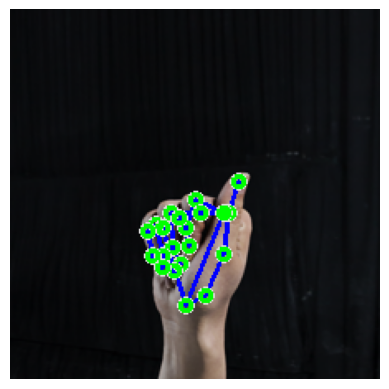

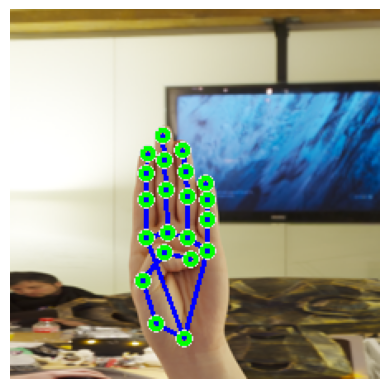

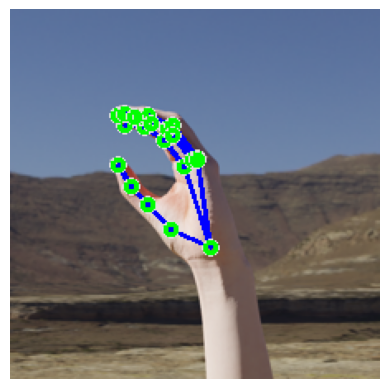

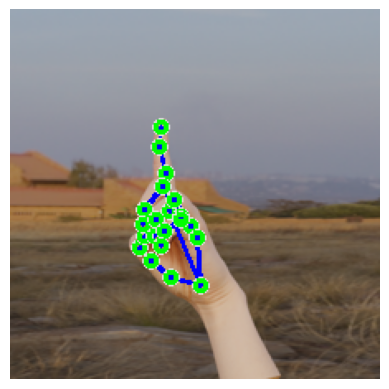

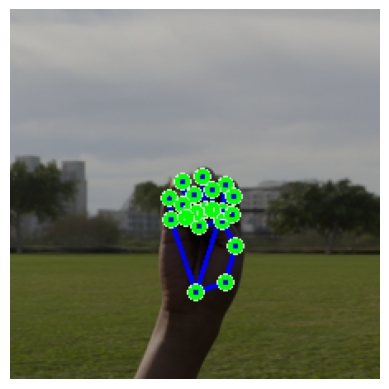

...

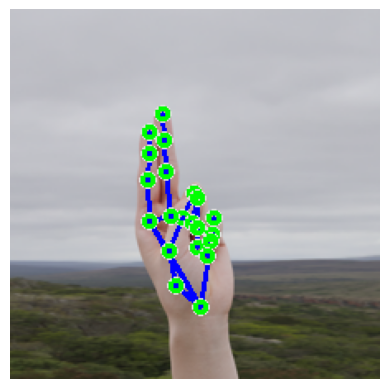

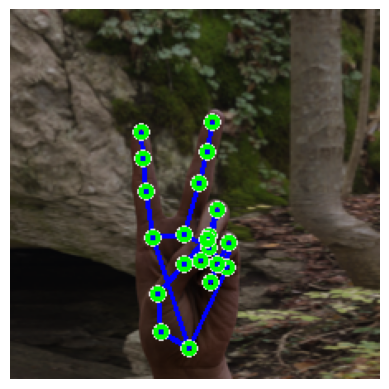

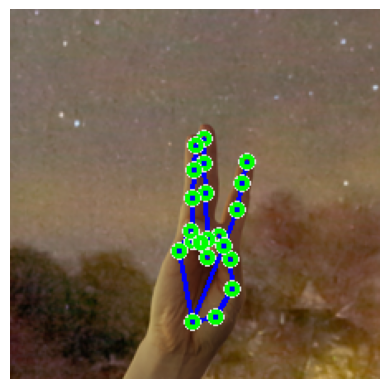

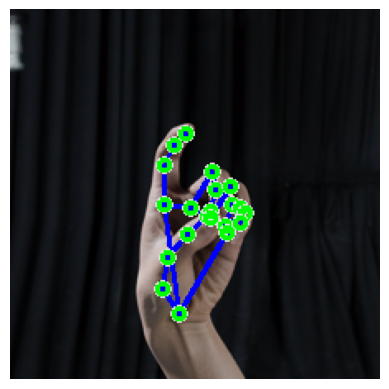

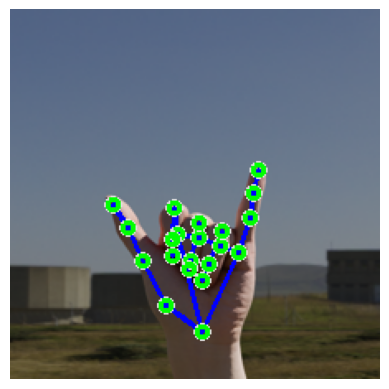

In [35]:
target_size = (224, 224)

for key, value in synthetic_train_filenames_dict.items():
    idx = np.random.randint(0, len(value))
    image_path = value[idx]
    
    hand_landmarks = get_hand_landmarks(image_path)
    # print(f"Hand landmarks for image of class '{key}': {hand_landmarks}")  # 21 landmarks with x, y, z coordinates